# Установка **Detectron2**

In [5]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8MB 26kB/s 
     |████████████████████████████████| 6.6MB 48.2MB/s 
  Found existing installation: torch 1.5.1+cu101
    Uninstalling torch-1.5.1+cu101:
      Successfully uninstalled torch-1.5.1+cu101
  Found existing installation: torchvision 0.6.1+cu101
    Uninstalling torchvision-0.6.1+cu101:
      Successfully uninstalled torchvision-0.6.1+cu101
     |████████████████████████████████| 276kB 6.8MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44074 sha256=02a9dff3799a536e42fbe64e779d9dcb2f07ac2991f909b3fcf3ab33e5641788
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip

In [6]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
     |████████████████████████████████| 6.2MB 918kB/s 
  Created wheel for fvcore: filename=fvcore-0.1.1.post20200623-cp36-none-any.whl size=41183 sha256=5ee478c4be3af811b78144d1c4e5bf613c07f1b049b046ac248af5c99798a408
  Stored in directory: /root/.cache/pip/wheels/31/b5/a9/df0fd43b263cc96c1d5076ade63fdcdd30fab8699e3366a60c
Successfully built fvcore


In [7]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

# **Обучение на пользовательском Датасете**

# Подготовка Датасета

In [8]:
# монтируем гугл диск
from google.colab import drive
drive.mount('/content/gdrive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive/


In [10]:
import json
import os
from detectron2.structures import BoxMode

In [11]:
def get_stack_dicts(img_dir):
    json_file = os.path.join(img_dir, "stack.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)

    dataset_dicts = []

    for v in imgs_anns["images"]:
        record = {}

        record["file_name"] = os.path.join(img_dir, v["file_name"])
        record["image_id"] = v["id"]
        record["height"] = v["height"]
        record["width"] = v["width"]

        objs = []
        for anno in imgs_anns["annotations"] :
            if anno["image_id"] == v["id"]:
                obj = {
                    "bbox": [anno["bbox"][0], anno["bbox"][1], anno["bbox"][0]+anno["bbox"][2], anno["bbox"][1]+anno["bbox"][3]], 
                    "bbox_mode": BoxMode.XYXY_ABS,
                    "segmentation": anno["segmentation"],
                    "category_id": 0,
                }
                objs.append(obj)

        record["annotations"] = objs
        dataset_dicts.append(record)

    return dataset_dicts

In [12]:
from detectron2.data import DatasetCatalog, MetadataCatalog

Регистрация в каталоге

In [13]:
DatasetCatalog.register("stack_train", lambda d="train": get_stack_dicts("/content/gdrive/My Drive/Datasets/stack/" + d))
DatasetCatalog.register("stack_val", lambda d="val": get_stack_dicts("/content/gdrive/My Drive/Datasets/stack/" + d))

In [14]:
MetadataCatalog.get("stack_train").set(thing_classes=["stack"])
MetadataCatalog.get("stack_val").set(thing_classes=["stack"])

Metadata(name='stack_val', thing_classes=['stack'])

In [15]:
stack_metadata = MetadataCatalog.get("stack_train")

In [18]:
dataset_dicts = get_stack_dicts("/content/gdrive/My Drive/Datasets/stack/train")

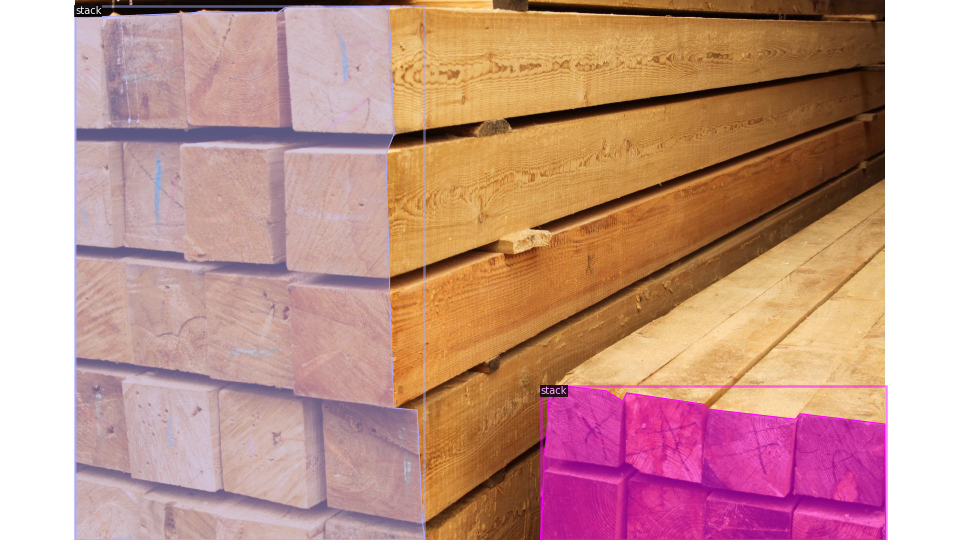

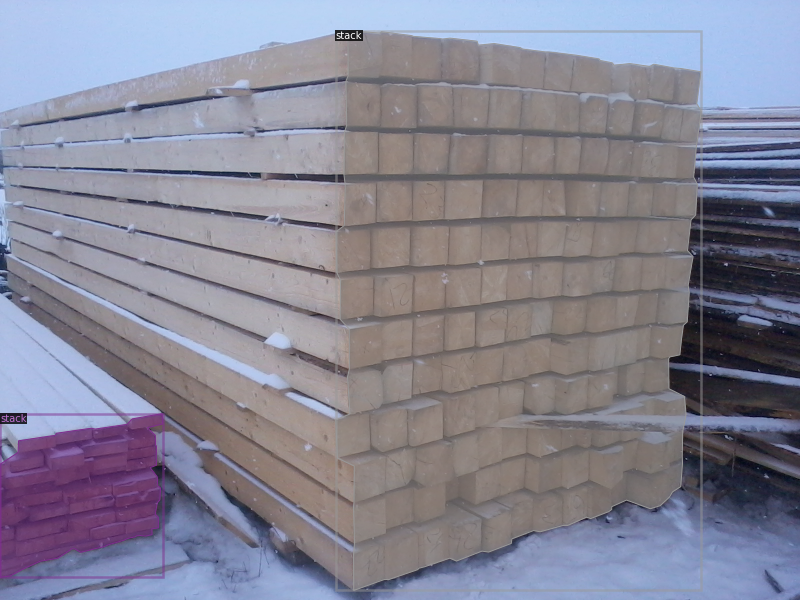

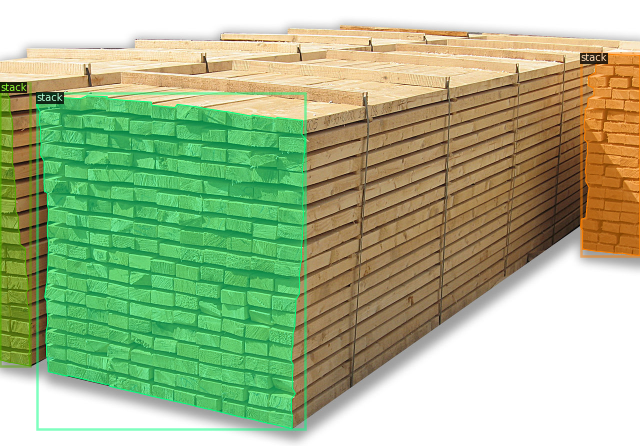

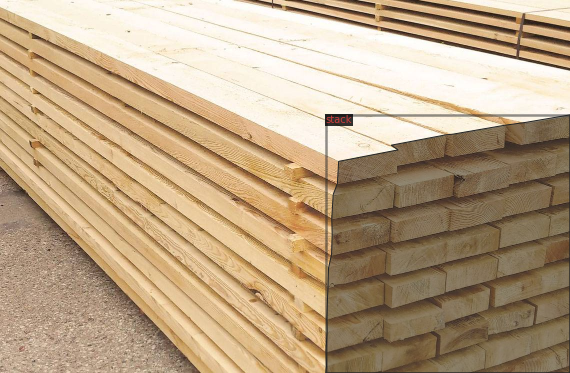

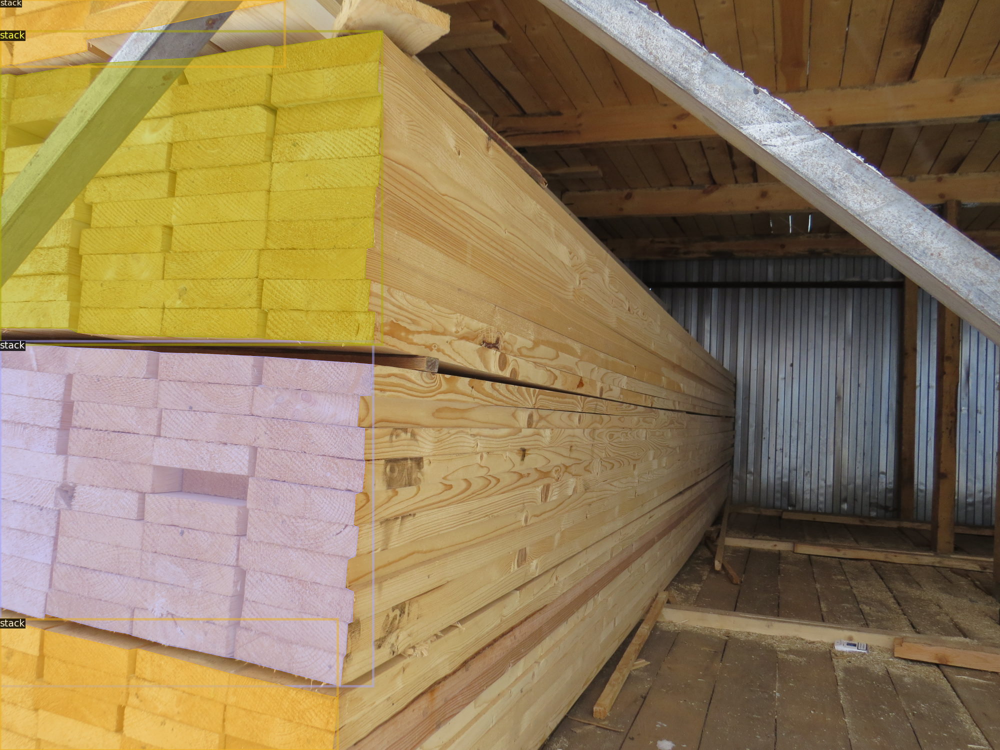

In [19]:
#dataset_dicts = get_stack_dicts("/content/gdrive/My Drive/Datasets/stack/train")
for d in random.sample(dataset_dicts, 5):
#for i in range(23):
    #d = dataset_dicts[i+60]
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=stack_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

In [20]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

cfg = get_cfg()

In [21]:
#from detectron2.engine import DefaultTrainer
#from detectron2.config import get_cfg

#cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("stack_train",)
cfg.DATASETS.TEST = ()
#cfg.DATALOADER.NUM_WORKERS = 2
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
#cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.BASE_LR = 0.001  # pick a good LR
#cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough for this toy dataset; you may need to train longer for a practical dataset
cfg.SOLVER.MAX_ITER = 600    # 300 iterations seems good enough for this toy dataset; you may need to train longer for a practical dataset
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 4   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[06/28 12:57:47 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:20, 8.72MB/s]                           
Unable to load 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model!
Unable to load 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model!
Unable to load 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model!
Unable to load 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model!
Unable to load 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in the model!
Unable to load 'roi_heads.mask_head.predictor.bias' to the model due to incompatible shapes: (80,) in the checkpoint but (1,) in the model!


[06/28 12:58:15 d2.engine.train_loop]: Starting training from iteration 0
[06/28 12:58:41 d2.utils.events]:  eta: 0:11:46  iter: 19  total_loss: 2.670  loss_cls: 0.659  loss_box_reg: 1.045  loss_mask: 0.695  loss_rpn_cls: 0.106  loss_rpn_loc: 0.026  time: 1.2494  data_time: 0.0531  lr: 0.000020  max_mem: 2673M
[06/28 12:59:04 d2.utils.events]:  eta: 0:11:09  iter: 39  total_loss: 2.385  loss_cls: 0.592  loss_box_reg: 0.912  loss_mask: 0.663  loss_rpn_cls: 0.066  loss_rpn_loc: 0.017  time: 1.2015  data_time: 0.0072  lr: 0.000040  max_mem: 2756M
[06/28 12:59:28 d2.utils.events]:  eta: 0:10:51  iter: 59  total_loss: 2.176  loss_cls: 0.491  loss_box_reg: 0.968  loss_mask: 0.614  loss_rpn_cls: 0.047  loss_rpn_loc: 0.015  time: 1.2009  data_time: 0.0084  lr: 0.000060  max_mem: 2756M
[06/28 12:59:52 d2.utils.events]:  eta: 0:10:30  iter: 79  total_loss: 2.175  loss_cls: 0.430  loss_box_reg: 0.996  loss_mask: 0.530  loss_rpn_cls: 0.038  loss_rpn_loc: 0.022  time: 1.2052  data_time: 0.0067  lr:

In [22]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [23]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9   # set the testing threshold for this model
cfg.DATASETS.TEST = ("stack_val", )
predictor = DefaultPredictor(cfg)

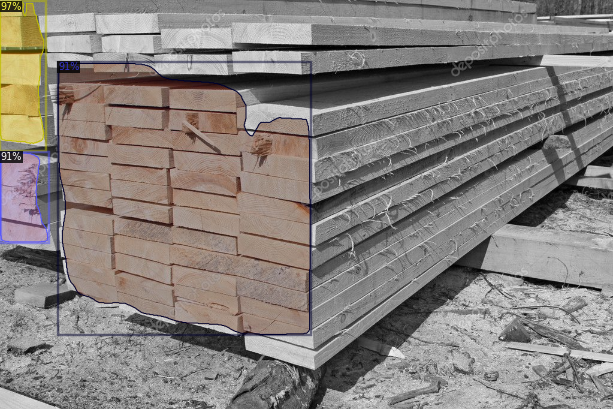

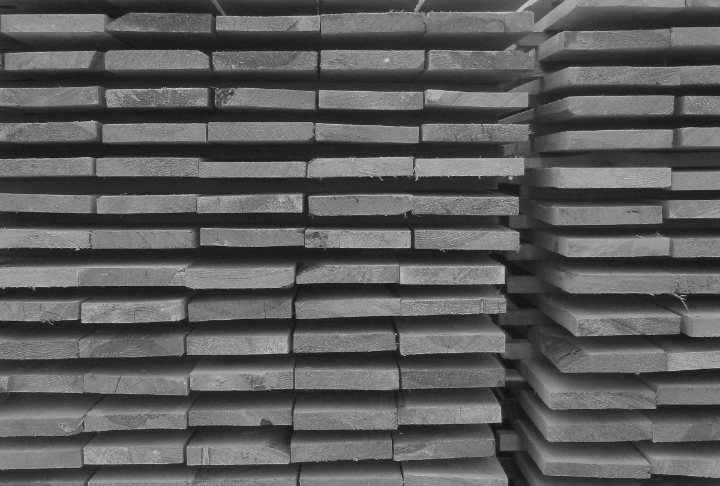

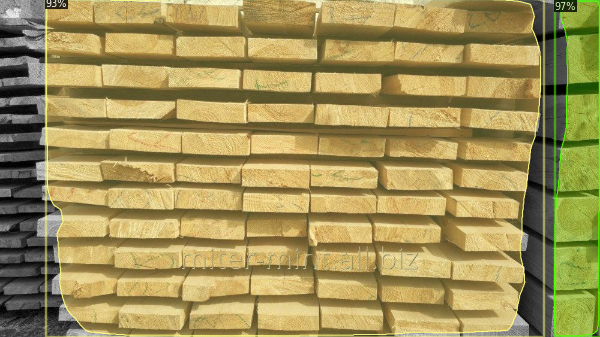

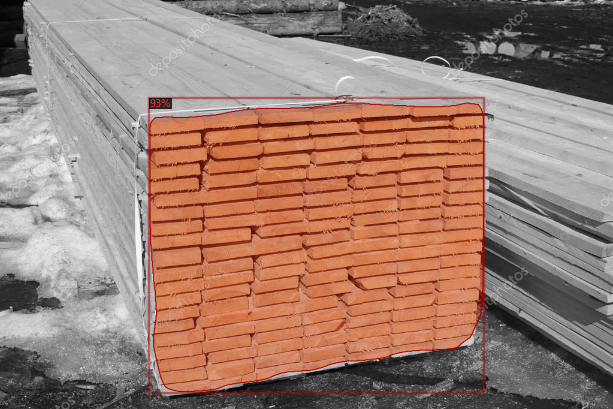

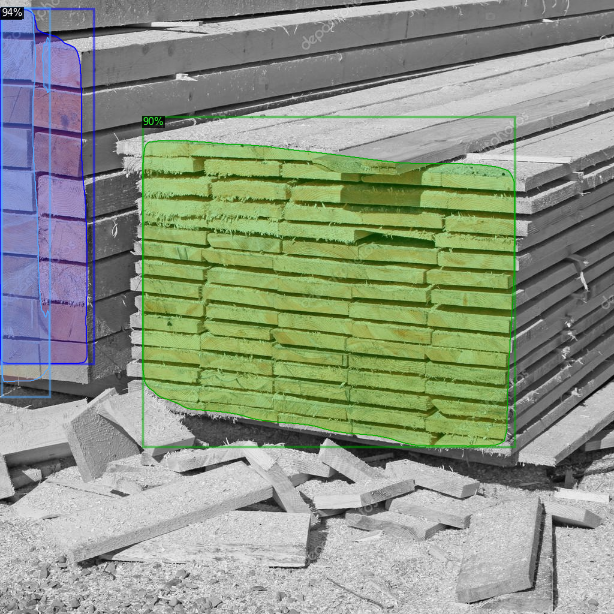

In [24]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_stack_dicts("/content/gdrive/My Drive/Datasets/stack/val")
for d in random.sample(dataset_dicts, 5):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=stack_metadata, 
                   scale=0.6, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [25]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("stack_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "stack_val")
inference_on_dataset(trainer.model, val_loader, evaluator)
# another equivalent way is to use trainer.test

WARNING [06/28 13:13:08 d2.evaluation.coco_evaluation]: json_file was not found in MetaDataCatalog for 'stack_val'. Trying to convert it to COCO format ...
[06/28 13:13:08 d2.data.datasets.coco]: Converting annotations of dataset 'stack_val' to COCO format ...)
[06/28 13:13:08 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[06/28 13:13:08 d2.data.datasets.coco]: Conversion finished, #images: 22, #annotations: 63
[06/28 13:13:08 d2.data.datasets.coco]: Caching COCO format annotations at './output/stack_val_coco_format.json' ...
[06/28 13:13:08 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|   stack    | 63           |
|            |              |
[06/28 13:13:08 d2.data.common]: Serializing 22 elements to byte tensors and concatenating them all ...
[06/28 13:13:08 d2.data.common]: Serialized dataset takes 0.07 MiB
[06/28 13:13:09 d2.evaluation.evaluator]: Start inference on 22 images
[06/

OrderedDict([('bbox',
              {'AP': 54.27354317160441,
               'AP50': 79.76128664341505,
               'AP75': 68.20942353364394,
               'APl': 54.314439022495506,
               'APm': 60.0,
               'APs': nan}),
             ('segm',
              {'AP': 59.86603804693479,
               'AP50': 78.42868183052542,
               'AP75': 66.31779792561574,
               'APl': 61.227229195267896,
               'APm': 60.19801980198019,
               'APs': nan})])